In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_curve , roc_auc_score ,classification_report,accuracy_score
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pickle

In [2]:
df=pd.read_csv("X Education.csv")

In [3]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [4]:
df.shape

(9240, 37)

In [5]:
df.isnull().sum()

Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

In [6]:
pf=ProfileReport(df)

In [7]:
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
pf.to_file("XEducation_EDA.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
#Need to handle the Missing values.

df.columns

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'Lead Profile', 'City', 'Asymmetrique Activity Index',
       'Asymmetrique Profile Index', 'Asymmetrique Activity Score',
       'Asymmetrique Profile Score',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [10]:
df["Lead Source"]=df["Lead Source"].fillna(df["Lead Source"].mode()[0])

In [11]:
#Dropping the columns having excessive missing values

df.drop(columns=["TotalVisits","Total Time Spent on Website","Page Views Per Visit",],inplace=True)

In [12]:
df["Last Activity"]=df["Last Activity"].fillna(df["Last Activity"].mode()[0])

In [13]:
df["Country"]=df["Country"].fillna(df["Country"].mode()[0])

In [14]:
df["Specialization"]=df["Specialization"].fillna(df["Specialization"].mode()[0])

In [15]:
df["How did you hear about X Education"]=df["How did you hear about X Education"].fillna(df["How did you hear about X Education"].mode()[0])

In [16]:
df["What is your current occupation"]=df["What is your current occupation"].fillna(df["What is your current occupation"].mode()[0])

In [17]:
df["What matters most to you in choosing a course"]=df["What matters most to you in choosing a course"].fillna(df["What matters most to you in choosing a course"].mode()[0])

In [18]:
df["Tags"]=df["Tags"].fillna(df["Tags"].mode()[0])

In [19]:
#Dropping the columns having more than 45% to 50% of Missing values.

df.drop(columns=["Lead Quality","Asymmetrique Activity Index","Asymmetrique Profile Index","Asymmetrique Activity Score","Asymmetrique Profile Score"],inplace=True)

In [20]:
df["City"]=df["City"].fillna(df["City"].mode()[0])

In [21]:
df["Lead Profile"]=df["Lead Profile"].fillna(df["Lead Profile"].mode()[0])

In [22]:
df.isnull().sum()

Prospect ID                                      0
Lead Number                                      0
Lead Origin                                      0
Lead Source                                      0
Do Not Email                                     0
Do Not Call                                      0
Converted                                        0
Last Activity                                    0
Country                                          0
Specialization                                   0
How did you hear about X Education               0
What is your current occupation                  0
What matters most to you in choosing a course    0
Search                                           0
Magazine                                         0
Newspaper Article                                0
X Education Forums                               0
Newspaper                                        0
Digital Advertisement                            0
Through Recommendations        

In [23]:
df

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,Last Activity,Country,Specialization,...,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,Page Visited on Website,India,Select,...,No,No,Interested in other courses,No,No,Select,Select,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,Email Opened,India,Select,...,No,No,Ringing,No,No,Select,Select,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,Email Opened,India,Business Administration,...,No,No,Will revert after reading the email,No,No,Potential Lead,Mumbai,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,Unreachable,India,Media and Advertising,...,No,No,Ringing,No,No,Select,Mumbai,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,Converted to Lead,India,Select,...,No,No,Will revert after reading the email,No,No,Select,Mumbai,No,No,Modified
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9235,19d6451e-fcd6-407c-b83b-48e1af805ea9,579564,Landing Page Submission,Direct Traffic,Yes,No,1,Email Marked Spam,Saudi Arabia,IT Projects Management,...,No,No,Will revert after reading the email,No,No,Potential Lead,Mumbai,No,No,Email Marked Spam
9236,82a7005b-7196-4d56-95ce-a79f937a158d,579546,Landing Page Submission,Direct Traffic,No,No,0,SMS Sent,India,Media and Advertising,...,No,No,wrong number given,No,No,Potential Lead,Mumbai,No,Yes,SMS Sent
9237,aac550fe-a586-452d-8d3c-f1b62c94e02c,579545,Landing Page Submission,Direct Traffic,Yes,No,0,SMS Sent,India,Business Administration,...,No,No,invalid number,No,No,Potential Lead,Mumbai,No,Yes,SMS Sent
9238,5330a7d1-2f2b-4df4-85d6-64ca2f6b95b9,579538,Landing Page Submission,Google,No,No,1,SMS Sent,India,Human Resource Management,...,No,No,Will revert after reading the email,No,No,Select,Other Metro Cities,No,No,SMS Sent


In [24]:
pf=ProfileReport(df)

In [25]:
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
#Now need to convert all categorical varibles into Numerical variables

from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df=df.apply(le.fit_transform)

In [27]:
df

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,Last Activity,Country,Specialization,...,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,4427,9239,0,6,0,0,0,10,12,15,...,0,0,8,0,0,4,4,0,0,8
1,1554,9238,0,7,0,0,0,5,12,15,...,0,0,14,0,0,4,4,0,0,4
2,5140,9237,1,1,0,0,1,5,12,1,...,0,0,19,0,0,3,0,0,1,4
3,467,9236,1,1,0,0,0,13,12,11,...,0,0,14,0,0,4,0,0,0,8
4,1874,9235,1,3,0,0,1,1,12,15,...,0,0,19,0,0,4,0,0,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9235,951,4,1,1,1,0,1,4,25,8,...,0,0,19,0,0,3,0,0,0,3
9236,4782,3,1,1,0,0,0,12,12,11,...,0,0,25,0,0,3,0,0,1,12
9237,6184,2,1,1,1,0,0,12,12,1,...,0,0,21,0,0,3,0,0,1,12
9238,3055,1,1,3,0,0,1,12,12,7,...,0,0,19,0,0,4,3,0,0,12


In [28]:
%matplotlib inline

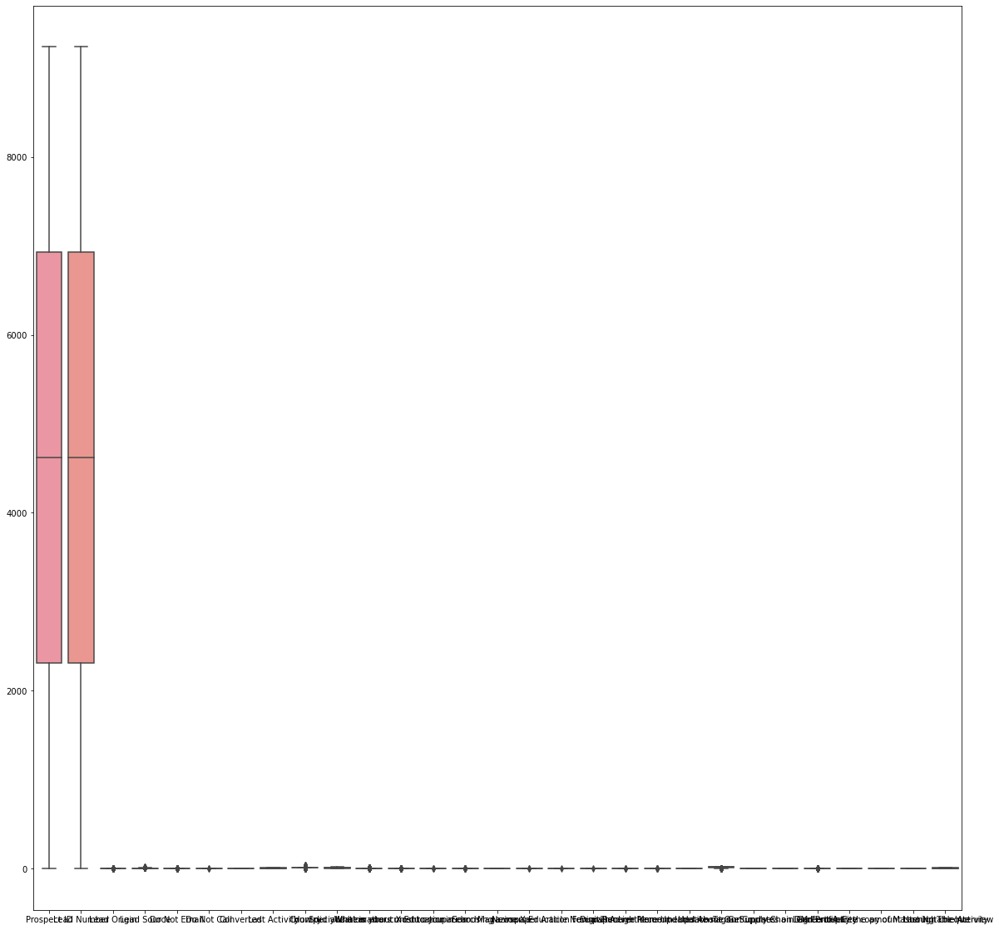

In [29]:
#As the dataset is skewed , need to check the outliers

fig , ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df,ax=ax)
plt.show()

In [30]:
#Now we will split the dataset

X=df.drop(columns="Converted")

In [31]:
X

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Last Activity,Country,Specialization,How did you hear about X Education,...,Through Recommendations,Receive More Updates About Our Courses,Tags,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,4427,9239,0,6,0,0,10,12,15,6,...,0,0,8,0,0,4,4,0,0,8
1,1554,9238,0,7,0,0,5,12,15,6,...,0,0,14,0,0,4,4,0,0,4
2,5140,9237,1,1,0,0,5,12,1,6,...,0,0,19,0,0,3,0,0,1,4
3,467,9236,1,1,0,0,13,12,11,9,...,0,0,14,0,0,4,0,0,0,8
4,1874,9235,1,3,0,0,1,12,15,4,...,0,0,19,0,0,4,0,0,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9235,951,4,1,1,1,0,4,25,8,6,...,0,0,19,0,0,3,0,0,0,3
9236,4782,3,1,1,0,0,12,12,11,6,...,0,0,25,0,0,3,0,0,1,12
9237,6184,2,1,1,1,0,12,12,1,6,...,0,0,21,0,0,3,0,0,1,12
9238,3055,1,1,3,0,0,12,12,7,3,...,0,0,19,0,0,4,3,0,0,12


In [32]:
y=df["Converted"]

In [33]:
y

0       0
1       0
2       1
3       0
4       1
       ..
9235    1
9236    0
9237    0
9238    1
9239    1
Name: Converted, Length: 9240, dtype: int64

In [34]:
#Now we will scale the data

scaler=StandardScaler()
scaler.fit_transform(df)

array([[-0.07216878,  1.73186337, -1.10876332, ...,  0.        ,
        -0.67428477,  0.09732052],
       [-1.14926445,  1.73148846, -1.10876332, ...,  0.        ,
        -0.67428477, -1.16743561],
       [ 0.19513689,  1.73111356,  0.46957177, ...,  0.        ,
         1.48305293, -1.16743561],
       ...,
       [ 0.58653539, -1.73111356,  0.46957177, ...,  0.        ,
         1.48305293,  1.36207666],
       [-0.58653539, -1.73148846,  0.46957177, ...,  0.        ,
        -0.67428477,  1.36207666],
       [-0.52992507, -1.73186337,  0.46957177, ...,  0.        ,
         1.48305293,  0.09732052]])

In [35]:
df_scalar=pd.DataFrame(scaler.fit_transform(df))

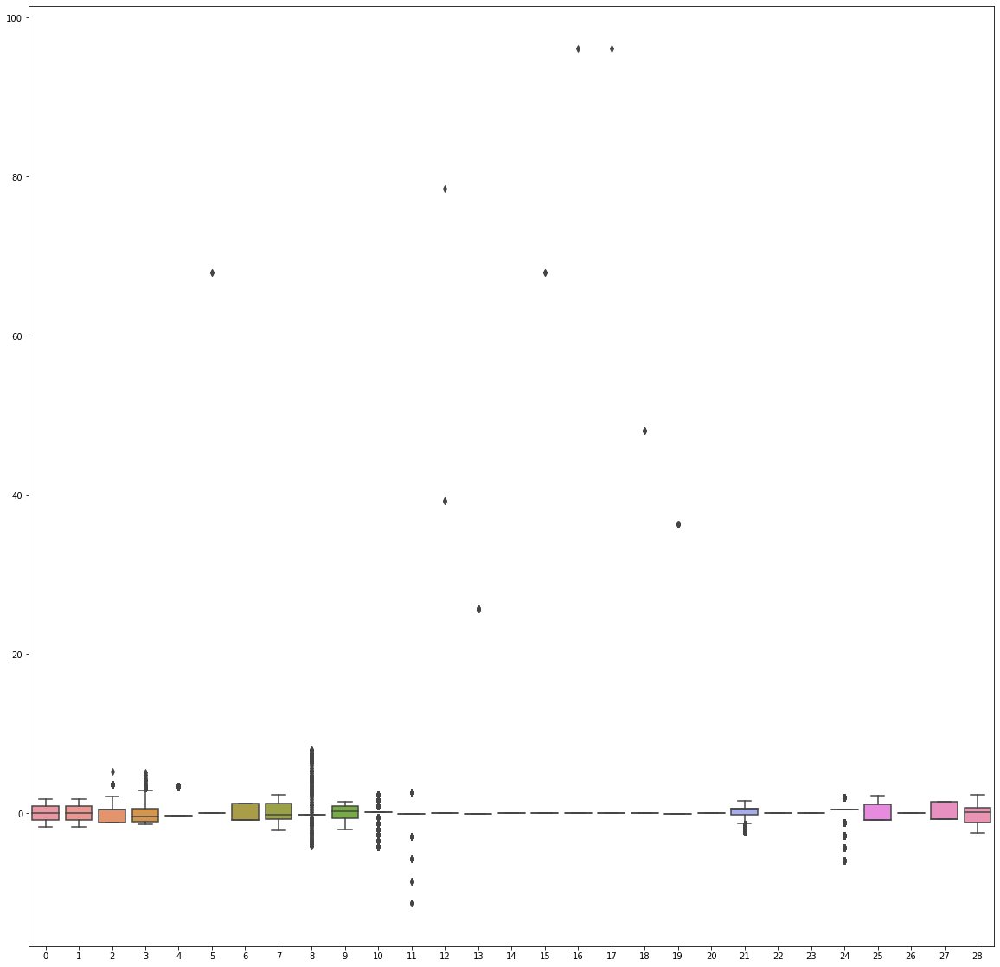

In [36]:
fig , ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df_scalar,ax=ax)
plt.show()

In [37]:
X_scaled=scaler.fit_transform(X)

In [38]:
X_scaled

array([[-0.07216878,  1.73186337, -1.10876332, ...,  0.        ,
        -0.67428477,  0.09732052],
       [-1.14926445,  1.73148846, -1.10876332, ...,  0.        ,
        -0.67428477, -1.16743561],
       [ 0.19513689,  1.73111356,  0.46957177, ...,  0.        ,
         1.48305293, -1.16743561],
       ...,
       [ 0.58653539, -1.73111356,  0.46957177, ...,  0.        ,
         1.48305293,  1.36207666],
       [-0.58653539, -1.73148846,  0.46957177, ...,  0.        ,
        -0.67428477,  1.36207666],
       [-0.52992507, -1.73186337,  0.46957177, ...,  0.        ,
         1.48305293,  0.09732052]])

In [39]:
pf=ProfileReport(df_scalar)

In [40]:
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [41]:
pf.to_file("Scaled_data.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [42]:
y

0       0
1       0
2       1
3       0
4       1
       ..
9235    1
9236    0
9237    0
9238    1
9239    1
Name: Converted, Length: 9240, dtype: int64

In [43]:
#Now need to check the multicollinearity

vif_df=pd.DataFrame()

In [44]:
X_scaled.shape

(9240, 28)

In [45]:
X_scaled.shape[1]

28

In [46]:
vif_df['vif']= [variance_inflation_factor(X_scaled,i)for i in range(X_scaled.shape[1])]

vif_df['feature']=X.columns

C:\Users\Sachin Kumar\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1717: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


In [47]:
vif_df

,vif,feature
0,1.002127,Prospect ID
1,1.055318,Lead Number
2,1.327651,Lead Origin
3,1.293790,Lead Source
4,1.057419,Do Not Email
5,1.001343,Do Not Call
6,2.354265,Last Activity
7,1.014744,Country
8,1.358216,Specialization
9,1.046904,How did you hear about X Education


In [48]:
x_train , x_test , y_train , y_test=train_test_split(X_scaled, y , test_size=.20 , random_state=100)

In [49]:
x_train

array([[-1.3033495 , -0.99105548, -1.10876332, ...,  0.        ,
        -0.67428477,  0.09732052],
       [-1.3445888 , -0.69300778,  0.46957177, ...,  0.        ,
         1.48305293,  1.36207666],
       [-1.38882733, -1.20475007,  0.46957177, ...,  0.        ,
         1.48305293,  1.36207666],
       ...,
       [ 0.50930542, -1.28198004, -1.10876332, ...,  0.        ,
        -0.67428477, -1.16743561],
       [-1.26998315, -0.86846228,  0.46957177, ...,  0.        ,
        -0.67428477,  0.09732052],
       [ 1.57590381, -0.38258828, -1.10876332, ...,  0.        ,
        -0.67428477,  0.09732052]])

In [50]:
x_test

array([[ 1.2763565 ,  0.13140342, -1.10876332, ...,  0.        ,
        -0.67428477,  1.36207666],
       [-0.05117423,  0.84109437,  2.04790686, ...,  0.        ,
        -0.67428477,  1.36207666],
       [-1.13014441, -1.17963158, -1.10876332, ...,  0.        ,
        -0.67428477,  1.67826569],
       ...,
       [-0.23000285,  1.38132927,  0.46957177, ...,  0.        ,
        -0.67428477, -1.16743561],
       [ 1.48367773,  0.66376536, -1.10876332, ...,  0.        ,
        -0.67428477,  0.09732052],
       [ 0.86096422,  1.07540861, -1.10876332, ...,  0.        ,
        -0.67428477, -1.16743561]])

# Logistic Regression

In [51]:
logr=LogisticRegression(verbose=1)

In [52]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [53]:
logr.predict(x_test[[1]])

array([1], dtype=int64)

In [54]:
logr.predict_proba(x_test[[1]])

array([[0.11988572, 0.88011428]])

In [55]:
logr.predict_log_proba(x_test[[1]])

array([[-2.12121633, -0.12770352]])

In [56]:
y_pred=logr.predict(x_test)

In [57]:
y_pred

array([0, 1, 1, ..., 0, 0, 0], dtype=int64)

In [58]:
confusion_matrix(y_test,y_pred)

array([[987, 129],
       [330, 402]], dtype=int64)

In [59]:
accuracy_score(y_test,y_pred)

0.7516233766233766

In [60]:
auc=roc_auc_score(y_test,y_pred)

In [61]:
auc

0.716794465009695

In [62]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.75      0.88      0.81      1116
           1       0.76      0.55      0.64       732

    accuracy                           0.75      1848
   macro avg       0.75      0.72      0.72      1848
weighted avg       0.75      0.75      0.74      1848



In [63]:
fpr, tpr, thresholds= roc_curve(y_test,y_pred)

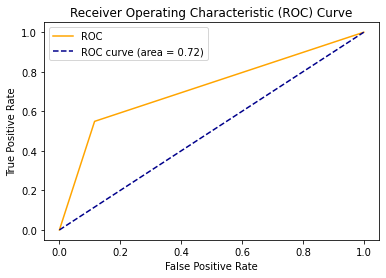

In [64]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [65]:
pickle.dump(logr,open("Xeducation_logr_model.pickle","wb"))

In [66]:
logr_liblinear=LogisticRegression(verbose=1)

In [67]:
logr_liblinear.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [68]:
logr_liblinear.predict(x_test[[1]])

array([1], dtype=int64)

In [69]:
logr_liblinear.predict_proba(x_test[[1]])

array([[0.11988572, 0.88011428]])

In [70]:
logr_liblinear.predict_log_proba(x_test[[1]])

array([[-2.12121633, -0.12770352]])

In [71]:
y_pred_liblinear=logr_liblinear.predict(x_test)

In [72]:
y_pred_liblinear

array([0, 1, 1, ..., 0, 0, 0], dtype=int64)

In [73]:
confusion_matrix(y_test,y_pred_liblinear)

array([[987, 129],
       [330, 402]], dtype=int64)

In [74]:
accuracy_score(y_test,y_pred_liblinear)

0.7516233766233766

In [75]:
auc_liblinear=roc_auc_score(y_test,y_pred_liblinear)

In [76]:
auc_liblinear

0.716794465009695

In [77]:
print(classification_report(y_test,y_pred_liblinear))

              precision    recall  f1-score   support

           0       0.75      0.88      0.81      1116
           1       0.76      0.55      0.64       732

    accuracy                           0.75      1848
   macro avg       0.75      0.72      0.72      1848
weighted avg       0.75      0.75      0.74      1848



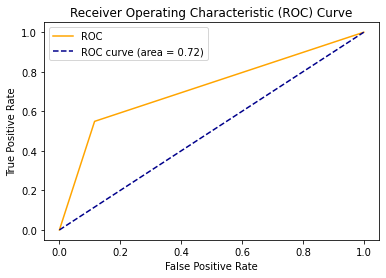

In [78]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc_liblinear)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [79]:
pickle.dump(logr_liblinear,open("Xeducation_logrliblinear_model.pickle","wb"))

# Accuracy of 75% and Area under the Curve is 72%.